In [1]:
import sys 
import os 
import time 
import pathlib 
from typing import TypedDict , Annotated , Sequence 
from IPython.display import Markdown as md , display , Audio 
from dotenv import load_dotenv
# --- LangGraph Imports --- 
from langgraph.graph import StateGraph , END 
from langgraph.checkpoint.memory import MemorySaver
import operator 
# --- Other Tools --- 
from firecrawl import Firecrawl 
import fitz 
import dspy 
from google import genai 
from google.genai import types 
import mimetypes 
import struct


In [2]:
# --- Load Env --- 
load_dotenv(dotenv_path=os.path.join(os.getcwd(), ".env"))

# --- Get FireCrawl --- 
FIRECRAWL_API_KEY = os.getenv("FIRECRAWL_API_KEY")
# --- Get Gemini --- 
GEMINI_API_KEY = os.getenv("GEMINI_API_KEY")

if not FIRECRAWL_API_KEY or not GEMINI_API_KEY:
    raise ValueError("FIRECRAWL_API_KEY or GEMINI_API_KEY not found in environment variables")
print("API keys loaded successfully")


API keys loaded successfully


In [3]:
# --- Initialize Clients --- 
firecrawl = Firecrawl(api_key=FIRECRAWL_API_KEY)
gemini_client = genai.Client(api_key=GEMINI_API_KEY)
# --- Configure DSPy --- 
gemini_lm = dspy.LM(
    model="gemini/gemini-flash-latest",
    api_key=GEMINI_API_KEY,
)
dspy.configure(lm=gemini_lm)
print("All Clients initialized ")

All Clients initialized 


In [4]:
# --- Time to thing About LangGraph --- 
# --- First We need to Define the State ---- 
# --- So Basically, this is the state that defines the Flow --- 
"""
USER INPUT
  │
  ▼
(podcast_title, sources[])
  │
  ├─► URL-worker ──► processed_sources ──┐
  ├─► PDF-worker ──► processed_sources ──┤  (parallel)
  ├─► NOTE-worker ─► processed_sources ──┘
  │
  ▼
synthesise_context  (wait until len(processed_sources) == len(sources))
  │
  ▼
generate_script
  │
  ▼
generate_audio ──► audio_file
  │
  ▼
COMPLETE
"""
class PodcastState(TypedDict):
    """
        State of the PodCast Agent
    """
    # --- Input --- 
    podcast_title: str 
    sources: Annotated[List[dict],operator.add]
    # --- Processing -- 
    processed_sources: Annotated[List[dict],operator.add]
    processing_errors: Annotated[List[str],operator.add]
    # --- Output --- 
    synthesized_context: str 
    podcast_script: str 
    audio_file: str 
    # --- Status --
    status: str 
    current_step: str 

In [5]:
# --- Source Processors --- 
# --- Here for Url Processing ---
def process_url(url: str) -> str:
    """ 
        Process a URL to extract its content.
    """
    try:
        result = firecrawl_client.scrape(
            url=url,
            formats=["markdown"],
            only_main_content=True,
            timeout=30000,
        )
        return f"# URL: {url}\n\n{result.markdown}"
    except Exception as e:
        return f"Error processing {url}: {str(e)}"
# --- Here for Pdf Processing --- 
def process_pdf(pdf_path: str) -> str:
    """ 
        Extract text from PDF using PyMuPDF .
    """
    try:
        doc = fitz.open(pdf_path)
        text = "\n".join(page.get_text() for page in doc)
        return f"# PDF: {pdf_path}\n\n{text}"
    except Exception as e:
        return f"Error processing {pdf_path}: {str(e)}"
# --- For Manual Note Processing --- 
def process_manual_note(note: str) -> str:
    """ 
        Process a manual note.
    """
    return f"# Manual Note:\n\n{note}"


In [6]:
# --- Helper Functions For Audio Generation ---
def convert_to_wav(audio_data: bytes, mime_type: str) -> bytes:
    """
        Convert audio data to WAV format
    """
    def parse_audio_mime_type(mime_type: str) -> dict:
        bits_per_sample = 16
        rate = 24000
        parts = mime_type.split(";")
        for param in parts:
            param = param.strip()
            if param.lower().startswith("rate="):
                try:
                    rate = int(param.split("=", 1)[1])
                except (ValueError, IndexError):
                    pass
            elif param.startswith("audio/L"):
                try:
                    bits_per_sample = int(param.split("L", 1)[1])
                except (ValueError, IndexError):
                    pass
        return {"bits_per_sample": bits_per_sample, "rate": rate}
    
    parameters = parse_audio_mime_type(mime_type)
    bits_per_sample = parameters["bits_per_sample"]
    sample_rate = parameters["rate"]
    num_channels = 1
    data_size = len(audio_data)
    bytes_per_sample = bits_per_sample // 8
    block_align = num_channels * bytes_per_sample
    byte_rate = sample_rate * block_align
    chunk_size = 36 + data_size
    
    header = struct.pack(
        "<4sI4s4sIHHIIHH4sI",
        b"RIFF", chunk_size, b"WAVE", b"fmt ", 16, 1,
        num_channels, sample_rate, byte_rate, block_align,
        bits_per_sample, b"data", data_size
    )
    return header + audio_data

def generate_audio(script: str, output_file: str) -> str:
    """
        Generate multi-speaker audio using Gemini TTS
    """
    model = "gemini-2.5-flash-preview-tts"
    
    contents = [
        types.Content(
            role="user",
            parts=[types.Part.from_text(text=script)],
        ),
    ]
    
    config = types.GenerateContentConfig(
        temperature=1,
        response_modalities=["audio"],
        speech_config=types.SpeechConfig(
            multi_speaker_voice_config=types.MultiSpeakerVoiceConfig(
                speaker_voice_configs=[
                    types.SpeakerVoiceConfig(
                        speaker="Speaker 1",
                        voice_config=types.VoiceConfig(
                            prebuilt_voice_config=types.PrebuiltVoiceConfig(
                                voice_name="Zephyr"
                            )
                        ),
                    ),
                    types.SpeakerVoiceConfig(
                        speaker="Speaker 2",
                        voice_config=types.VoiceConfig(
                            prebuilt_voice_config=types.PrebuiltVoiceConfig(
                                voice_name="Puck"
                            )
                        ),
                    ),
                ]
            ),
        ),
    )
    
    audio_data = b""
    for chunk in gemini_client.models.generate_content_stream(
        model=model, contents=contents, config=config
    ):
        if (chunk.candidates and chunk.candidates[0].content and 
            chunk.candidates[0].content.parts):
            part = chunk.candidates[0].content.parts[0]
            if part.inline_data and part.inline_data.data:
                inline_data = part.inline_data
                data_buffer = inline_data.data
                file_extension = mimetypes.guess_extension(inline_data.mime_type)
                if file_extension is None:
                    data_buffer = convert_to_wav(inline_data.data, inline_data.mime_type)
                audio_data += data_buffer
    
    with open(output_file, "wb") as f:
        f.write(audio_data)
    
    return output_file

In [7]:
# --- Here We Focus on defining the Nodes --- 
# --- First Node Ingest Sources Node --- 
def ingest_sources_node(state: PodcastState) -> PodcastState:
    """
        Node: Initialize and validate sources
    """
    print(f"Ingesting {len(state['sources'])} sources...")
    return {
        "current_step": "source_ingestion",
        "status": "PROCESSING",
        "processed_sources": [],
        "processing_errors": []
    }
#--- Second Node Process Sources Node in // --- 
def process_sources_node(state: PodcastState) -> PodcastState:
    """
        Process sources in parallel.
    """
    print(f"Processing {len(state['processed_sources'])} sources...")
    # --- Define The List of Processing ---
    processed = []
    errors = []
    for source in state["sources"]:
        source_type = source["type"]
        raw_input = source["raw_input"]
        try:
            if source_type == "URL":
                content = process_url(raw_input)
            elif source_type == "PDF":
                content = process_pdf(raw_input)
            elif source_type == "NOTES":
                content = process_manual_note(raw_input)
            else:
                raise ValueError(f"Unknown source type: {source_type}")
            processed.append(content)
            print(f"  Processed {source_type}: {raw_input[:50]}...")
        except Exception as e:
            errors.append(f"{source_type}: {raw_input[:50]}... -> {str(e)}")
            print(f"  Error processing {source_type}: {raw_input[:50]}... -> {str(e)}")

    return {
        "processed_sources": processed,
        "errors": errors,
        "current_step": "source_processing"
    }
# --- Third Node Synthesize All Context for the Agent from Sources  ---
def synthesize_context_node(state: PodcastState) -> PodcastState:
    """
        Synthesize context from processed sources.
    """
    print("Synthesizing context...")
    
    if not state["processed_sources"]:
        return {
            "status": "FAILED",
            "current_step": "context_synthesis",
            "synthesized_context": ""
        }
    
    # --- Combine all sources with separators --- 
    combined = "\n\n---\n\n".join(state["processed_sources"])
    
    return {
        "synthesized_context": combined,
        "current_step": "context_synthesis"
    }
# --- Fourth Node Generate Script --- 
# --- Fourth Node Generate Script --- 
def generate_script_node(state: PodcastState) -> PodcastState:
    """
        Generate script from synthesized context.
    """
    print("Generating script...")
    
    # --- Here We Define DSpy Signature ---- 
    class ContextToScript(dspy.Signature):
        """
            Convert context to script.
        """
        context = dspy.InputField(desc="Synthesized content from all sources")
        podcast_title = dspy.InputField(desc="Title of the podcast episode")
        script = dspy.OutputField(desc="Conversational podcast script with Speaker 1 and Speaker 2")

    # --- We Use Chain of Thought for Better Reasoning --- 
    script_generator = dspy.ChainOfThought(ContextToScript)  
    
    # --- Get the result --- 
    result = script_generator(
        context=state["synthesized_context"], 
        podcast_title=state["podcast_title"]
    )
    
    return {
        "podcast_script": result.script,
        "current_step": "script_generation"
    }
# --- Finally Generate Audio Node --- 
def generate_audio_node(state: PodcastState) -> PodcastState:
    """
        Node: Generate audio from script
    """
    print("Generating audio...")
    
    output_file = f"podcast_{int(time.time())}.wav"
    audio_path = generate_audio(state["podcast_script"], output_file)
    
    return {
        "audio_file": audio_path,
        "current_step": "audio_generation",
        "status": "COMPLETE"
    }
# --- Error Node --- 
def error_handler_node(state: PodcastState) -> PodcastState:
    """
        Node: Handle errors gracefully
    """
    print("Error handler triggered")
    return {
        "status": "FAILED",
        "current_step": "error_handling"
    }


In [8]:
# --- Define Conditions --- 
def should_continue_processing(state: PodcastState) -> str:
    """
        Decide whether to continue after source processing
    """
    if len(state["processed_sources"]) == 0:
        return "error"
    return "continue"

def route_after_script(state: PodcastState) -> str:
    """
        Route after script generation
    """
    if not state.get("podcast_script"):
        return "error"
    return "generate_audio"

In [9]:
# --- Let's Build the Agent Graph ---
# --- Initialize the state Graph --- 
workflow = StateGraph(PodcastState)
# --- NEXT We Add Nodes --- 
workflow.add_node("ingest_sources",ingest_sources_node)
workflow.add_node("process_sources",process_sources_node)
workflow.add_node("synthesize_context", synthesize_context_node)
workflow.add_node("generate_script", generate_script_node)
workflow.add_node("generate_audio",generate_audio_node)
workflow.add_node("error_handler", error_handler_node)


In [10]:
# --- Here We Define the Flow --- 
workflow.set_entry_point("ingest_sources")
workflow.add_edge("ingest_sources","process_sources")
# --- Conditional Routing After Processing --- 
workflow.add_conditional_edges(
    "process_sources",
    should_continue_processing,
    {
        "continue": "synthesize_context",
        "error": "error_handler"
    }
)
workflow.add_edge("synthesize_context","generate_script")
# --- Conditional Routing After Script Generation --- 
workflow.add_conditional_edges(
    "generate_script",
    route_after_script,
    {
        "generate_audio": "generate_audio",
        "error": "error_handler"
    }
)
# --- Add Edge from Audio Generation to End --- 
workflow.add_edge("generate_audio",END)
workflow.add_edge("error_handler",END)


In [11]:
# --- Fonalyinally Compile the Graph & Checkpointing ---
memory = MemorySaver()
app = workflow.compile(checkpointer=memory)
print("LangGraph Workflow Compiled Successfully ")


LangGraph Workflow Compiled Successfully 


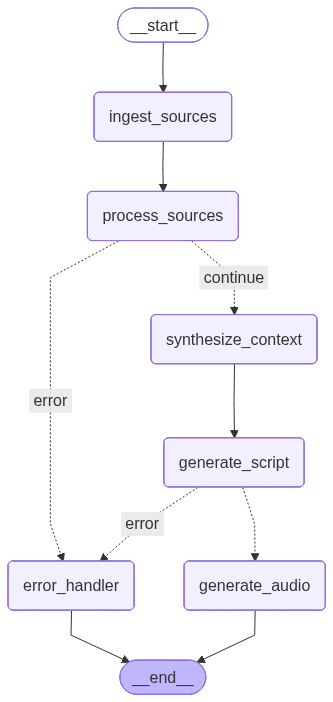

In [12]:
# --- Visual Display --- 
try:
    from IPython.display import Image
    display(Image(app.get_graph().draw_mermaid_png()))
except Exception as e:
    print(f"Could not render graph: {e}")
    print("Graph structure defined successfully (visualization requires graphviz)")

In [13]:
# %%
# === COMPLETE TEST WITH DISPLAY ===
print("=" * 70)
print("TESTING COMPLETE PODCAST GENERATION PIPELINE")
print("=" * 70)

# Test input with multiple source types
test_input = {
    "podcast_title": "The Future of AI Assistants",
    "sources": [
        {
            "type": "URL",
            "raw_input": "https://blog.langchain.dev/langgraph-cloud/"
        },
        {
            "type": "NOTES", 
            "raw_input": """
            Key discussion points:
            - How AI assistants are evolving beyond simple chatbots
            - The role of state management in complex workflows
            - Multi-modal capabilities (text, audio, vision)
            - Enterprise adoption challenges and solutions
            - Future trends: personalization and proactive assistance
            """
        }
    ],
    "status": "PENDING",
    "current_step": "initialization"
}

print(f"Podcast Title: {test_input['podcast_title']}")
print(f"Sources: {len(test_input['sources'])}")
for i, source in enumerate(test_input['sources'], 1):
    print(f"  {i}. {source['type']}: {source['raw_input'][:80]}...")

print("\n" + "🚀 Starting pipeline execution..." + "\n")

# Execute the pipeline
config = {"configurable": {"thread_id": "demo_test_001"}}
final_state = None

# Stream execution with progress tracking
for step, event in enumerate(app.stream(test_input, config)):
    for node_name, node_output in event.items():
        print(f"📋 Step {step + 1}: {node_name.upper()}")
        if node_output.get('current_step'):
            print(f"   Status: {node_output['current_step'].replace('_', ' ').title()}")
        if node_output.get('processed_sources'):
            print(f"   Processed: {len(node_output['processed_sources'])} sources")
        if node_output.get('processing_errors'):
            print(f"   Errors: {len(node_output['processing_errors'])}")
        print()

# Get final results
final_state = app.get_state(config)

print("=" * 70)
print("PIPELINE EXECUTION COMPLETE")
print("=" * 70)

# Display results
if final_state.values.get("status") == "COMPLETE":
    display(md("# ✅ SUCCESS: Podcast Generated Successfully"))
    
    # Show script preview
    script = final_state.values["podcast_script"]
    display(md("## 📝 Generated Script"))
    display(md(f"```markdown\n{script[:1000]}...\n```"))
    
    # Show audio file info
    audio_path = final_state.values["audio_file"]
    display(md(f"## 🎵 Audio File: `{audio_path}`"))
    
    # Display audio player
    try:
        display(Audio(audio_path))
    except Exception as e:
        display(md(f"*Audio preview unavailable: {e}*"))
    
    # Show statistics
    display(md("## 📊 Execution Statistics"))
    display(md(f"""
    - **Sources Processed**: {len(final_state.values['processed_sources'])}
    - **Script Length**: {len(script)} characters
    - **Audio File**: {os.path.getsize(audio_path) / 1024:.1f} KB
    - **Final Status**: {final_state.values['status']}
    - **Last Step**: {final_state.values['current_step']}
    """))
    
else:
    display(md("# ❌ PIPELINE FAILED"))
    
    if final_state.values.get("processing_errors"):
        display(md("## Errors Encountered:"))
        for error in final_state.values["processing_errors"]:
            display(md(f"- `{error}`"))
    
    display(md(f"**Final Status**: {final_state.values.get('status', 'UNKNOWN')}"))
    display(md(f"**Failed Step**: {final_state.values.get('current_step', 'UNKNOWN')}"))

# Additional debug info
display(md("---"))
display(md("### 🔍 Debug Information"))
display(md(f"**Thread ID**: `{config['configurable']['thread_id']}`"))
display(md(f"**Checkpoint Available**: Yes (resumable)"))
display(md(f"**Total Nodes Executed**: {len(final_state.next)}"))

print("\n" + "=" * 70)
print("TEST COMPLETE - PIPELINE READY FOR PRODUCTION")
print("=" * 70)

TESTING COMPLETE PODCAST GENERATION PIPELINE
Podcast Title: The Future of AI Assistants
Sources: 2
  1. URL: https://blog.langchain.dev/langgraph-cloud/...
  2. NOTES: 
            Key discussion points:
            - How AI assistants are evolving...

🚀 Starting pipeline execution...

Ingesting 2 sources...
📋 Step 1: INGEST_SOURCES
   Status: Source Ingestion

Processing 0 sources...
  Processed URL: https://blog.langchain.dev/langgraph-cloud/...
  Processed NOTES: 
            Key discussion points:
            - ...
📋 Step 2: PROCESS_SOURCES
   Status: Source Processing
   Processed: 2 sources

Synthesizing context...
📋 Step 3: SYNTHESIZE_CONTEXT
   Status: Context Synthesis

Generating script...
📋 Step 4: GENERATE_SCRIPT
   Status: Script Generation

Generating audio...
📋 Step 5: GENERATE_AUDIO
   Status: Audio Generation

PIPELINE EXECUTION COMPLETE


# ✅ SUCCESS: Podcast Generated Successfully

## 📝 Generated Script

```markdown
**Speaker 1:** Welcome back to the show. Today, we’re diving deep into a topic that’s changing faster than we can track it: The Future of AI Assistants. We’re moving far beyond the simple chatbot era.

**Speaker 2:** Absolutely, Speaker 1. When we talk about AI assistants now, we’re not talking about the basic Q&A bots of five years ago. We’re talking about complex, workflow-managing agents. The key shift is that they are evolving from reactive tools—where you ask a question and get an answer—to proactive partners that manage multi-step tasks.

**Speaker 1:** That complexity immediately brings up a technical challenge: state management. If an assistant is handling a complex workflow—say, booking a multi-leg trip or processing a financial claim—it needs to remember where it is in the process, handle errors, and pick up exactly where it left off. Why is state management so critical for these complex workflows?

**Speaker 2:** It’s the difference between a conversation and a transaction. ...
```

## 🎵 Audio File: `podcast_1762196664.wav`

## 📊 Execution Statistics


    - **Sources Processed**: 2
    - **Script Length**: 3939 characters
    - **Audio File**: 10414.3 KB
    - **Final Status**: COMPLETE
    - **Last Step**: audio_generation
    

---

### 🔍 Debug Information

**Thread ID**: `demo_test_001`

**Checkpoint Available**: Yes (resumable)

**Total Nodes Executed**: 0


TEST COMPLETE - PIPELINE READY FOR PRODUCTION
